In [2]:
%matplotlib inline

In [3]:
import pandas
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image


sns.set()

In [4]:
#load data from csv
data = pandas.read_csv(r'C:\Users\user\Desktop\Shakespeare_data.csv')
#copy data
ndata=data.copy()
#show data
data.head()

,Data-line,Play,Player Line number,Act-Scene-Line,Player,Player-Line
0,1,Henry IV,NaN,NaN,NaN,ACT I
1,2,Henry IV,NaN,NaN,NaN,SCENE I. London. The palace.
2,3,Henry IV,NaN,NaN,NaN,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ..."
3,4,Henry IV,1.0,1.1.1,KING HENRY IV,"So shaken as we are, so wan with care,"
4,5,Henry IV,1.0,1.1.2,KING HENRY IV,"Find we a time for frighted peace to pant,"


In [75]:
import nltk
from nltk.corpus import stopwords 
#nltk.download()
english_stop=stopwords.words("english") 



In [79]:
stopwrds=[]
stop = ['shall', 'lord', 'lady', 'sir', 'my','us','yea','nay', 'mine', 'thy', 'll','thou','man','signior']
Players = ndata.Player.dropna().unique().tolist()
for player in Players:
    player=player.lower()
    stopwrds.append((player))
for stopwrd in stop:stopwrds.append((stopwrd))
for eng in english_stop: stopwrds.append((eng))

stopwrds

['king henry iv',
 'westmoreland',
 'falstaff',
 'prince henry',
 'poins',
 'earl of worcester',
 'northumberland',
 'hotspur',
 'sir walter blunt',
 'first carrier',
 'ostler',
 'second carrier',
 'gadshill',
 'chamberlain',
 'bardolph',
 'peto',
 'first traveller',
 'thieves',
 'travellers',
 'lady percy',
 'servant',
 'francis',
 'vintner',
 'hostess',
 'sheriff',
 'carrier',
 'mortimer',
 'glendower',
 'earl of douglas',
 'messenger',
 'vernon',
 'worcester',
 'archbishop of york',
 'sir michael',
 'lancaster',
 'bedford',
 'gloucester',
 'exeter',
 'of winchester',
 'charles',
 'alencon',
 'reignier',
 'bastard of orleans',
 'joan la pucelle',
 'first warder',
 'second warder',
 'woodvile',
 'mayor',
 'officer',
 'boy',
 'salisbury',
 'talbot',
 'gargrave',
 'glansdale',
 'sergeant',
 'first sentinel',
 'burgundy',
 'sentinels',
 'soldier',
 'captain',
 'of auvergne',
 'porter',
 'plantagenet',
 'suffolk',
 'somerset',
 'warwick',
 'lawyer',
 'first gaoler',
 'king henry vi',
 'al

In [80]:
data['Word_tokens']=data['Player-Line'].apply(lambda x:' '.join(w for w in nltk.word_tokenize(x.lower().strip()) if not w in stopwrds) )
df_play_content=pandas.DataFrame(data.groupby('Play')['Word_tokens'].apply(lambda x: "{%s}" % ', '.join(x)))
df_play_content.head()

,Word_tokens
Play,
A Comedy of Errors,"{act, scene i. hall solinus 's palace ., enter..."
A Midsummer nights dream,"{act, scene i. athens . palace ., enter , , ,,..."
A Winters Tale,"{act, scene i. antechamber ' palace ., enter, ..."
Alls well that ends well,"{act, scene i. rousillon . count 's palace ., ..."
Antony and Cleopatra,"{act, scene i. alexandria . room 's palace ., ..."


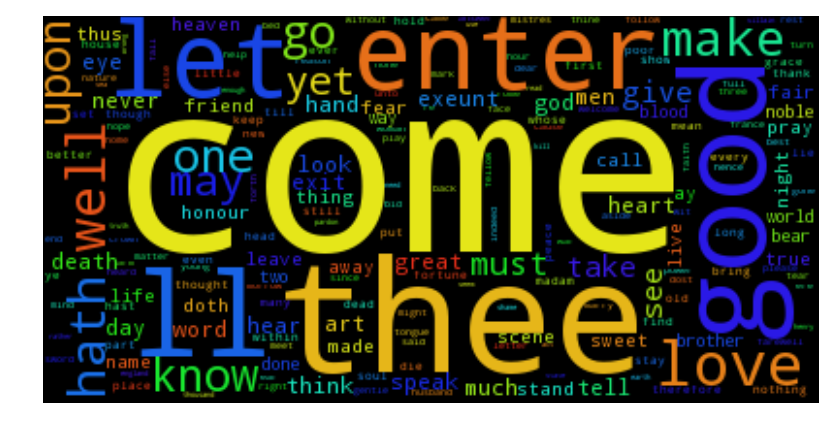

In [83]:
from wordcloud import WordCloud
cloud = WordCloud(margin=2,max_font_size=125).generate(' '.join(df_play_content['Word_tokens']))
plt.figure(figsize=(10, 10))
plt.imshow(cloud)
plt.axis('off')
plt.show()

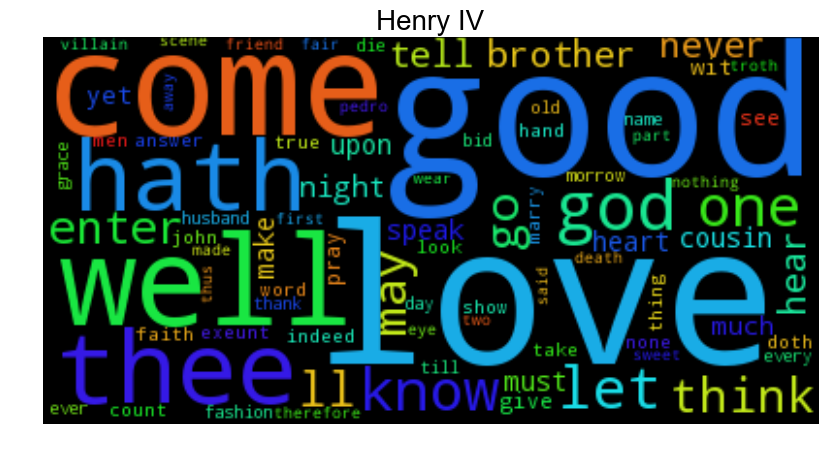

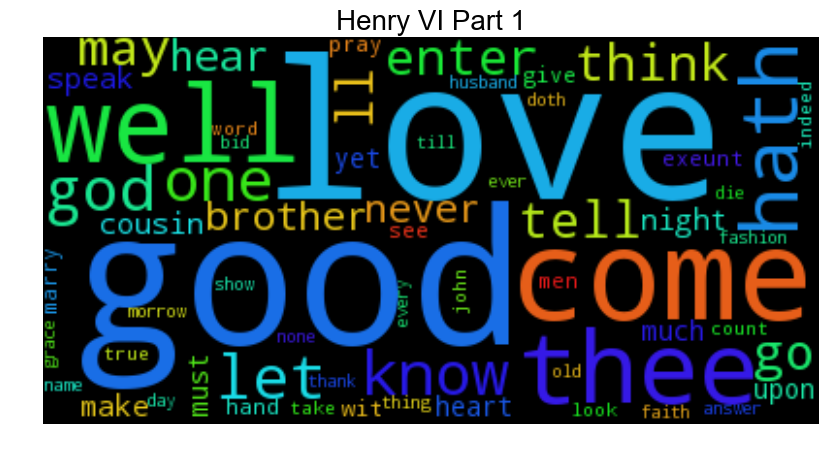

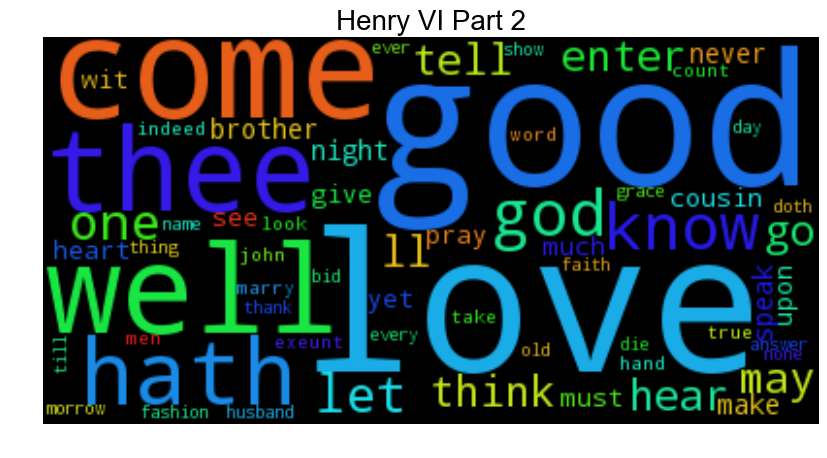

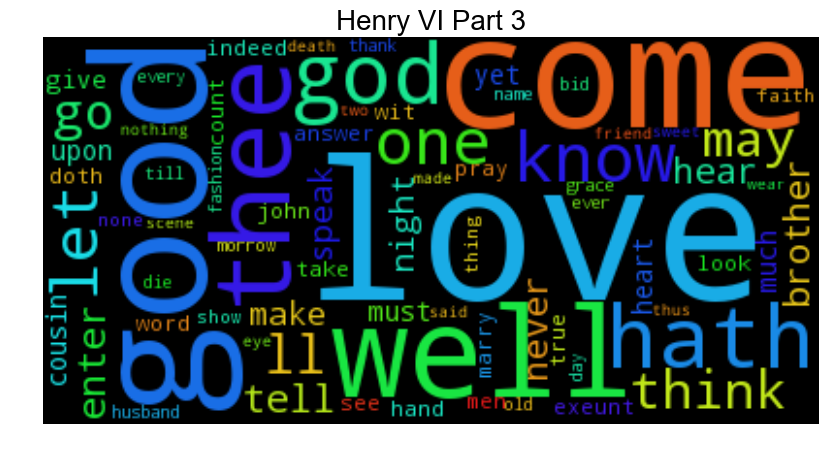

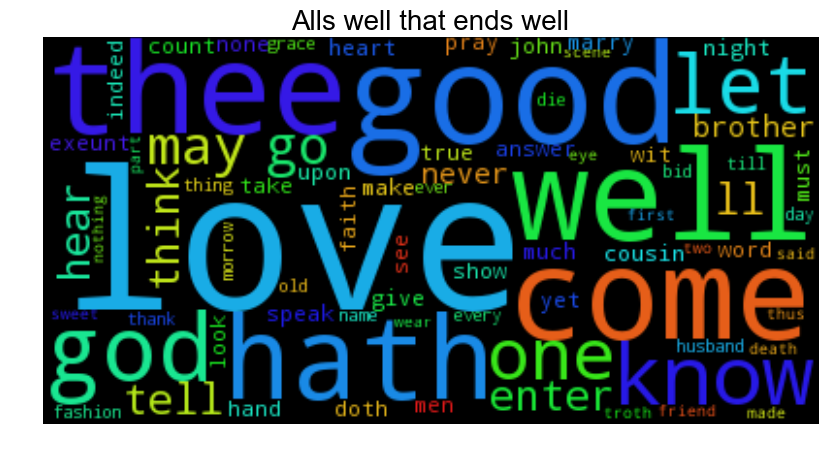

...

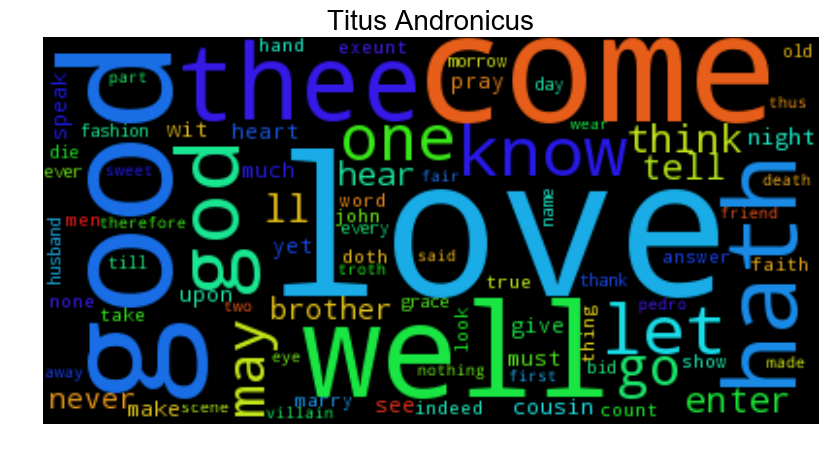

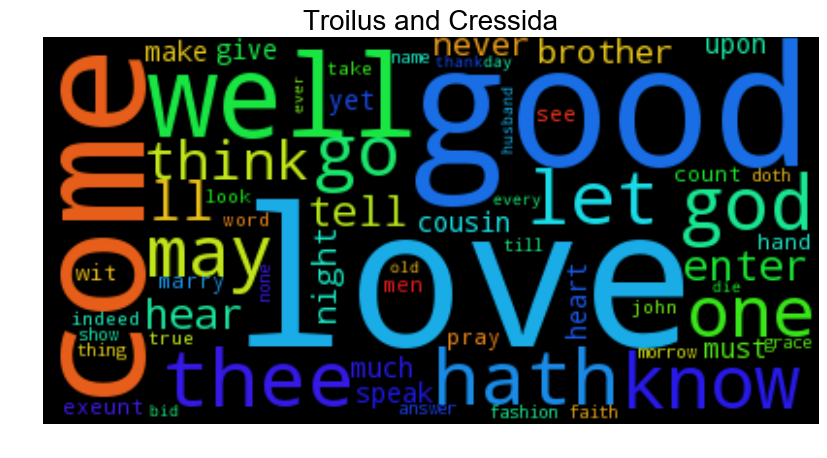

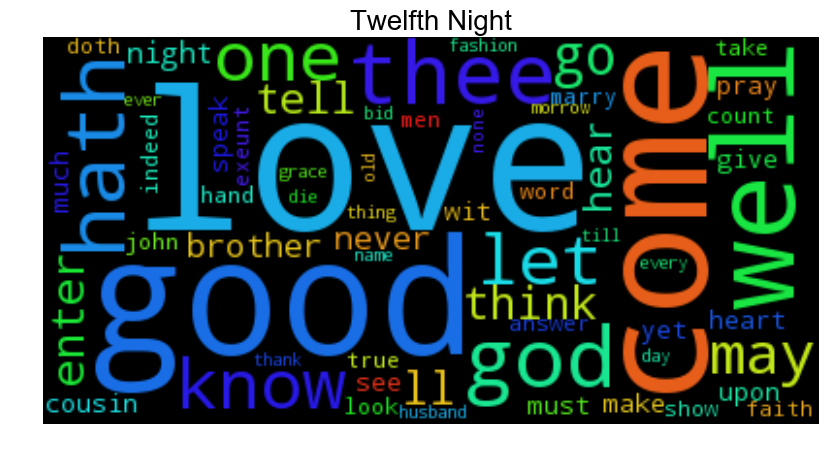

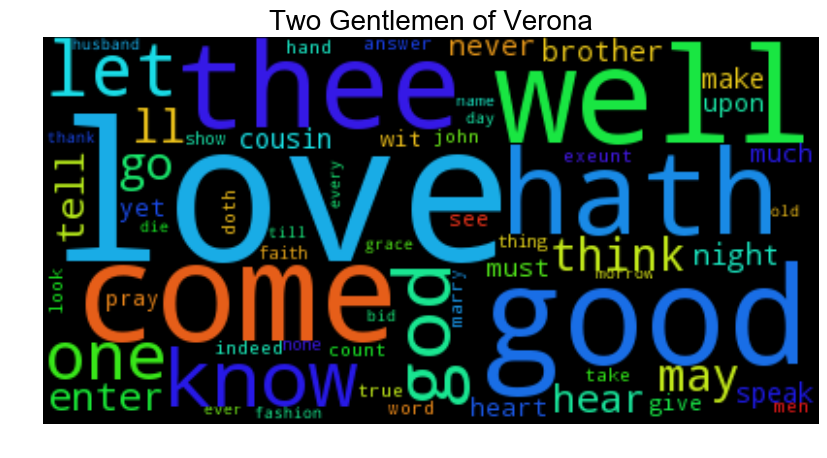

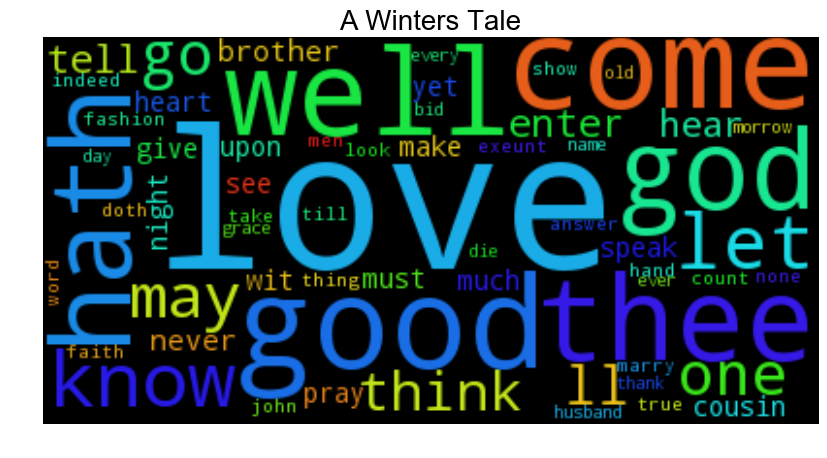

In [81]:

def generateWordCloud(str1,title):

    wordcloud = WordCloud( background_color='black',min_font_size=8, max_font_size=100).generate(str1)
    wordcloud.recolor(random_state=0)
    plt.figure(figsize=(10, 10))
    plt.title(title, fontsize=20,color='black')
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
for play in Plays:
    generateWordCloud(df_play_content.loc[cols,'Word_tokens'],play)